Import necessary modules

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

from sklearn import preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer
from sklearn import preprocessing
from pandas.core.common import not_none

from sklearn import linear_model as lm
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier as dtc
from sklearn.neighbors import KNeighborsClassifier as knnc
from sklearn.naive_bayes import GaussianNB as gnb
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.decomposition import PCA

from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import f1_score,confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve, precision_score, recall_score

from datetime import datetime
import io

Reading the dataset

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving weatherAUS.csv to weatherAUS.csv


In [ ]:
file_in = io.BytesIO(uploaded['weatherAUS.csv'])

In [ ]:
df = pd.read_csv(file_in)

SECTION 1 - EXPLORATORY DATA ANAYLYSIS

In [ ]:
df.head(3)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [ ]:
df.isna().sum()/len(df)

Date             0.000000
Location         0.000000
MinTemp          0.010209
MaxTemp          0.008669
Rainfall         0.022419
Evaporation      0.431665
Sunshine         0.480098
WindGustDir      0.070989
WindGustSpeed    0.070555
WindDir9am       0.072639
WindDir3pm       0.029066
WindSpeed9am     0.012148
WindSpeed3pm     0.021050
Humidity9am      0.018246
Humidity3pm      0.030984
Pressure9am      0.103568
Pressure3pm      0.103314
Cloud9am         0.384216
Cloud3pm         0.408071
Temp9am          0.012148
Temp3pm          0.024811
RainToday        0.022419
RainTomorrow     0.022460
dtype: float64

We see a number of missing values that we will dig into. Specifically, evaporation, sunshine, Cloud9am and cloud3pm have a high percentage of missing values.

In [ ]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


As RainTomorrow is the target variable, we'll drop the null values.

In [ ]:
df['RainTomorrow'].unique()

array(['No', 'Yes', nan], dtype=object)

In [ ]:
df['RainTomorrow'].value_counts(dropna=False)

No     110316
Yes     31877
NaN      3267
Name: RainTomorrow, dtype: int64

In [ ]:
df = df[df['RainTomorrow'].notna()]

In [ ]:
df.reset_index(inplace = True)


In [ ]:
df = df.drop("index", axis = 1)

In [ ]:
df['Location'].unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

The data contains daily weather information for the cities listed above. Each row represents a day.

In [ ]:
#df['dt_date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['dayofweek'] = df['Date'].dt.weekday
#df.drop('Date', axis = 1, inplace = True)

In [ ]:
df.head(2)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day,dayofweek
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,8.0,NaN,16.9,21.8,No,No,2008,12,1,0
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,NaN,NaN,17.2,24.3,No,No,2008,12,2,1


In [ ]:
df_location_year_evap = df.groupby(["Location", "Year"])["Evaporation"].mean()
[(x, y) for x, y in zip(df_location_year_evap.values, df_location_year_evap.index) if not(x > 0)]

[(nan, ('Adelaide', 2016)),
 (nan, ('Adelaide', 2017)),
 (nan, ('Albury', 2008)),
 (nan, ('Albury', 2009)),
 (nan, ('Albury', 2010)),
 (nan, ('Albury', 2011)),
 (nan, ('Albury', 2012)),
 (nan, ('Albury', 2013)),
 (nan, ('Albury', 2014)),
 (nan, ('Albury', 2015)),
 (nan, ('Albury', 2016)),
 (nan, ('Albury', 2017)),
 (nan, ('BadgerysCreek', 2009)),
 (nan, ('BadgerysCreek', 2010)),
 (nan, ('BadgerysCreek', 2011)),
 (nan, ('BadgerysCreek', 2012)),
 (nan, ('BadgerysCreek', 2013)),
 (nan, ('BadgerysCreek', 2014)),
 (nan, ('BadgerysCreek', 2015)),
 (nan, ('BadgerysCreek', 2016)),
 (nan, ('BadgerysCreek', 2017)),
 (nan, ('Ballarat', 2008)),
 (nan, ('Ballarat', 2009)),
 (nan, ('Ballarat', 2010)),
 (nan, ('Ballarat', 2011)),
 (nan, ('Ballarat', 2012)),
 (nan, ('Ballarat', 2013)),
 (nan, ('Ballarat', 2014)),
 (nan, ('Ballarat', 2015)),
 (nan, ('Ballarat', 2016)),
 (nan, ('Ballarat', 2017)),
 (nan, ('Bendigo', 2012)),
 (nan, ('Bendigo', 2015)),
 (nan, ('Bendigo', 2016)),
 (nan, ('Bendigo', 2017)),

We see that Evaporation data is not available for multiple cities and imputation here may not be a good idea as we don't see clear patterns.

In [ ]:
df['RainTomorrow'].value_counts()

No     110316
Yes     31877
Name: RainTomorrow, dtype: int64

In [ ]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day,dayofweek
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,8.0,NaN,16.9,21.8,No,No,2008,12,1,0
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,NaN,NaN,17.2,24.3,No,No,2008,12,2,1
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,NaN,2.0,21.0,23.2,No,No,2008,12,3,2
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,NaN,NaN,18.1,26.5,No,No,2008,12,4,3
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,7.0,8.0,17.8,29.7,No,No,2008,12,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,NaN,NaN,9.4,20.9,No,No,2017,6,20,1
142189,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,NaN,NaN,10.1,22.4,No,No,2017,6,21,2
142190,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,NaN,NaN,10.9,24.5,No,No,2017,6,22,3
142191,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,NaN,NaN,12.5,26.1,No,No,2017,6,23,4


In [ ]:
seasonality_check = df.groupby(['Date'])[['Evaporation', 'Sunshine', "Rainfall"]].mean()

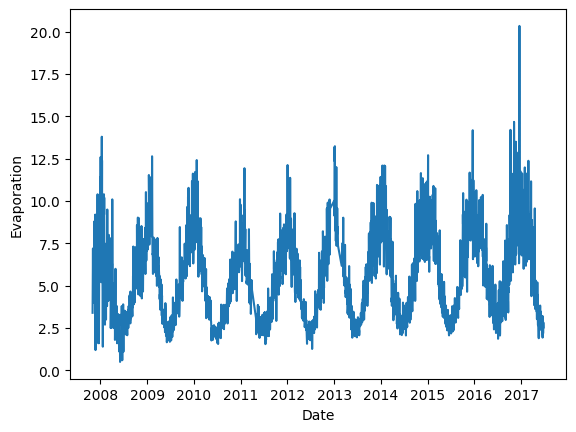

In [ ]:
sns.lineplot(x=seasonality_check.index ,y=seasonality_check.Evaporation);

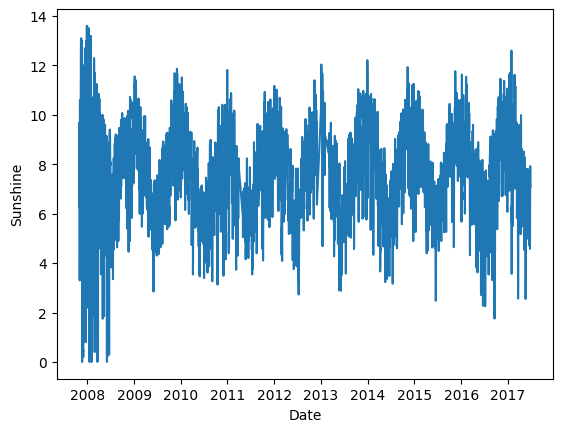

In [ ]:
sns.lineplot(x=seasonality_check.index ,y=seasonality_check.Sunshine);

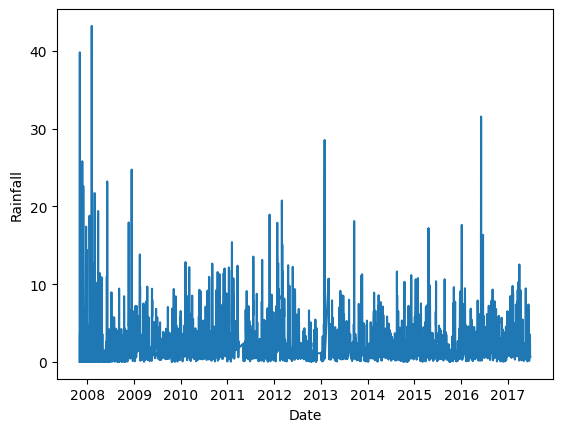

In [ ]:
sns.lineplot(x=seasonality_check.index ,y=seasonality_check.Rainfall);

Based on the time series graphs above, we see seasonality in Evaporation and Sunshine. The rainfall graph does not give us a lot of information as it is and we might be interested in performing autocorrelation if we wish to dive deeper into the seasonal trends of various weather conditions. However, our goal with this project is to determine best features and predict rain on the following day given weather conditions of that day.
- Evaporation is mostly missing by the whole month
- Sunshine & Evaporation are often missing at the same time
- 2017 January to June data, which is the end of the dataset time period, are often completely missing
- Some locations don't have evaporation data at all

In [ ]:
df.groupby(["Location", "Year"])[["Cloud9am", "Cloud3pm"]].mean()

Cloud9am  Cloud3pm
Location Year                    
Adelaide 2008       NaN       NaN
         2009       NaN       NaN
         2010       NaN       NaN
         2011       NaN       NaN
         2012       NaN       NaN
...                 ...       ...
Woomera  2013  2.081633  2.567273
         2014  2.117647  2.130268
         2015  2.375000  2.385714
         2016  2.750000  3.494565
         2017  2.980892  4.254237

[453 rows x 2 columns]

Similar to evaporation and sunshine, we see that entire locations are sometimes missing cloud data and hence, it might not be very reliable.

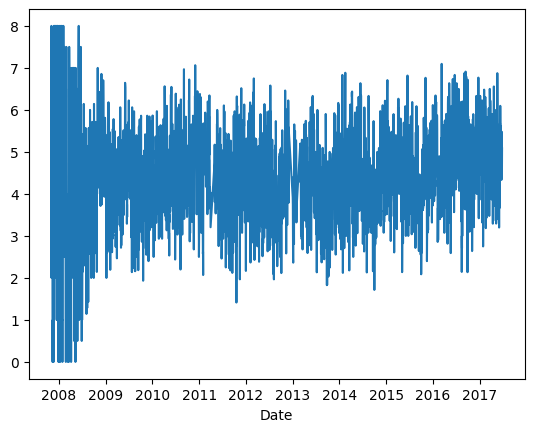

In [ ]:
pltdata = df.groupby(['Date'])['Cloud9am'].mean()
sns.lineplot(x=pltdata.index ,y=pltdata.values);

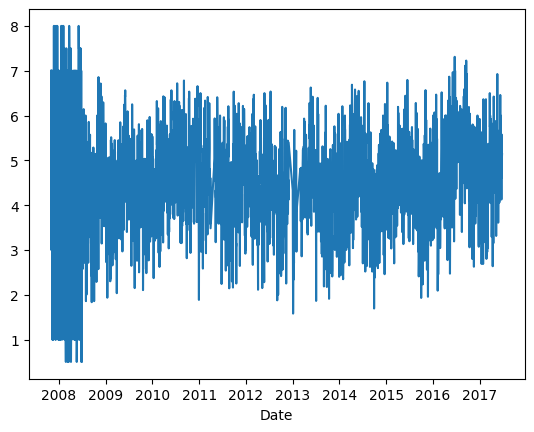

In [ ]:
pltdata = df.groupby(['Date'])['Cloud3pm'].mean()
sns.lineplot(x=pltdata.index ,y=pltdata.values);

We don't see a clear trend in the cloud data.

In [ ]:
dep_var = ['RainTomorrow']
categorical_vars = ['RainToday','Location','WindGustDir','WindDir9am','WindDir3pm']
continuous_vars = ['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm']
time_vars = ['Year','Month','Day', 'dayofweek']

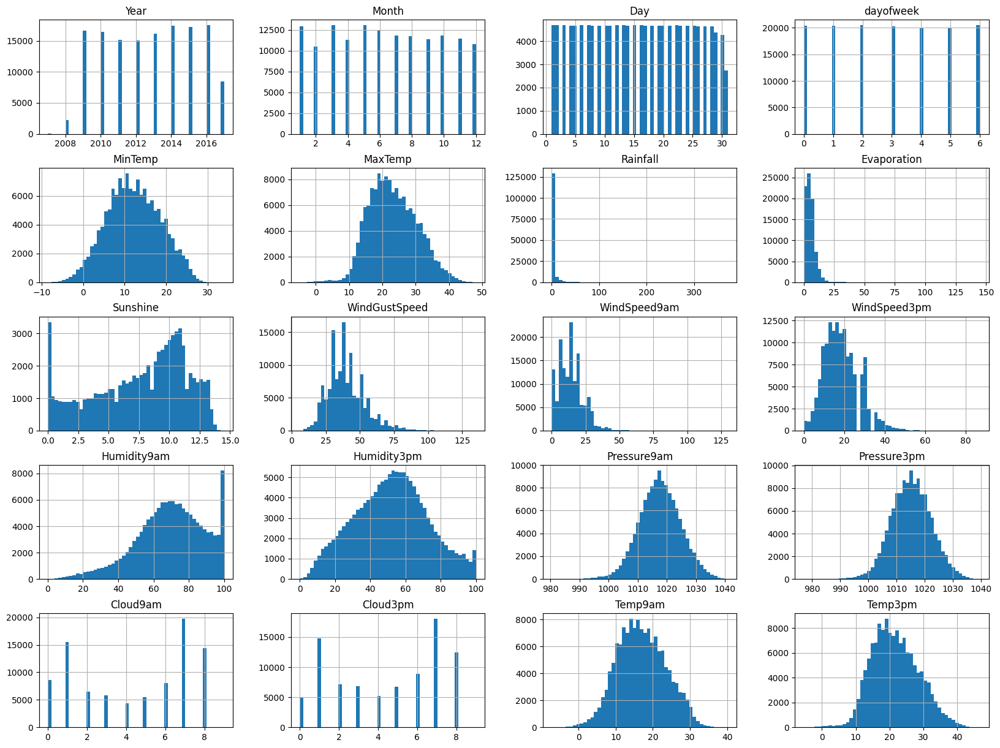

In [ ]:
df.loc[:, time_vars + continuous_vars].hist(bins=50, figsize=(20,15));
plt.show()

<Figure size 2000x2000 with 0 Axes>

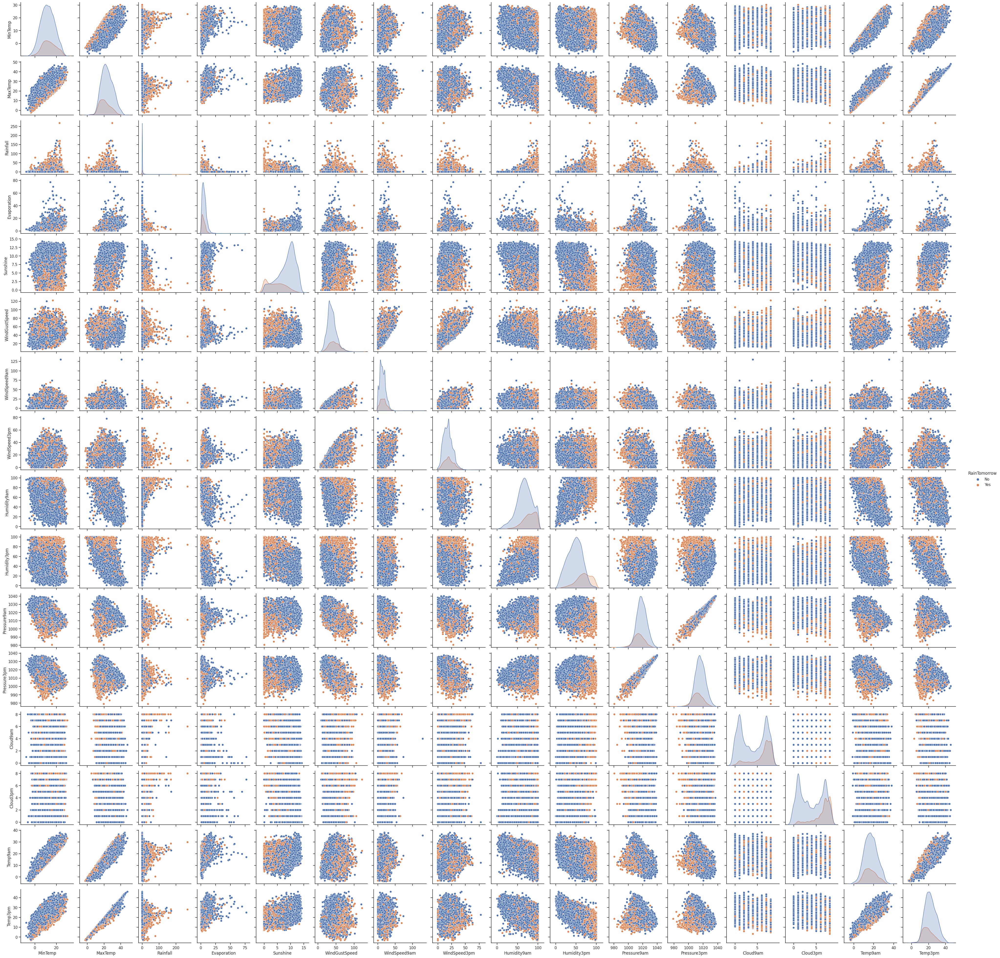

In [ ]:
df_sample = df.sample(20000)
sns.set(style='ticks')
plt.figure(figsize=(20,20))
sns.pairplot(df_sample[continuous_vars + dep_var], hue='RainTomorrow');

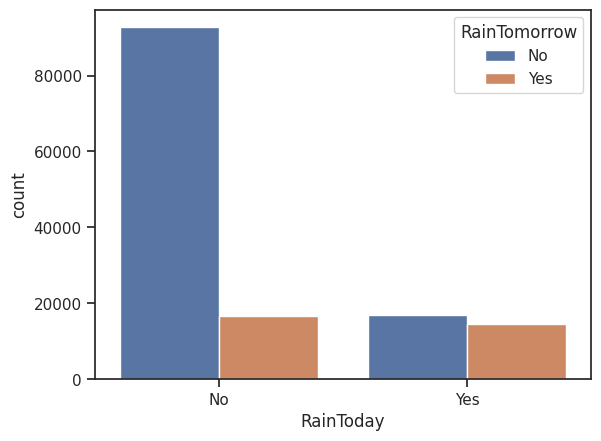

In [ ]:
sns.countplot(x='RainToday', hue='RainTomorrow', data=df);

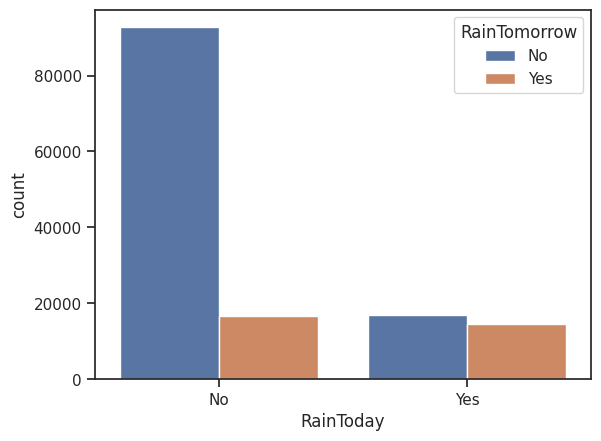

In [ ]:
sns.countplot(x='RainToday', hue='RainTomorrow', data=df);

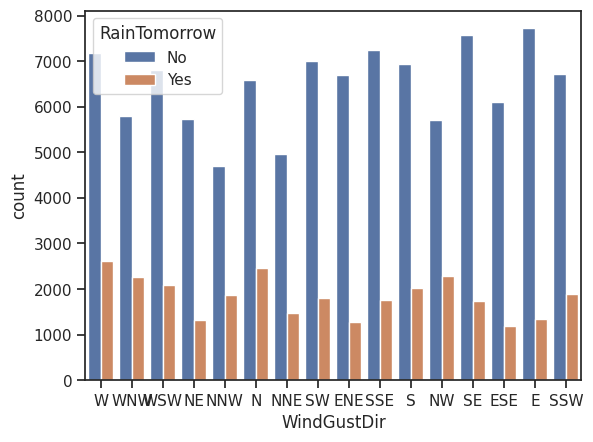

In [ ]:
sns.countplot(x='WindGustDir', hue='RainTomorrow', data=df);

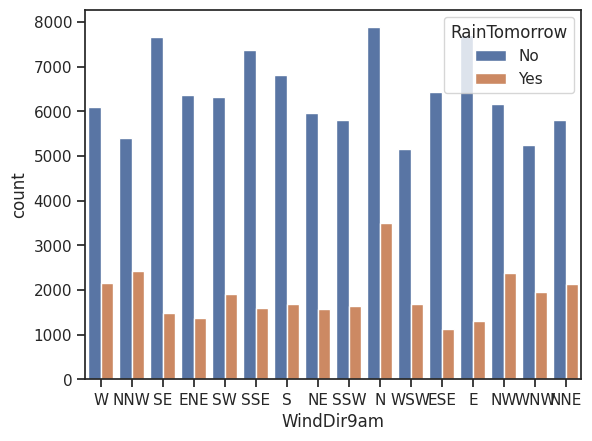

In [ ]:
sns.countplot(x='WindDir9am', hue='RainTomorrow', data=df);

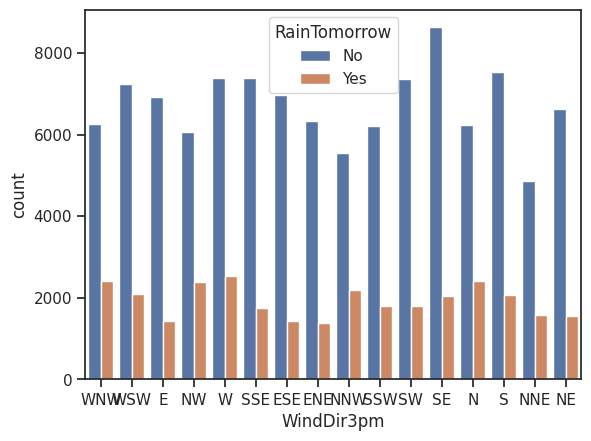

In [ ]:
sns.countplot(x='WindDir3pm', hue='RainTomorrow', data=df);

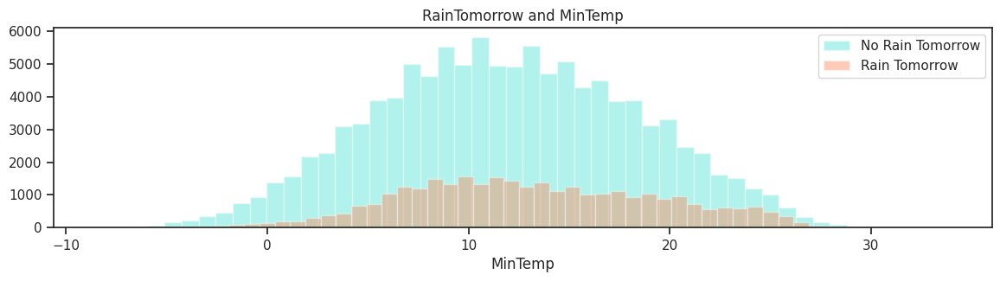

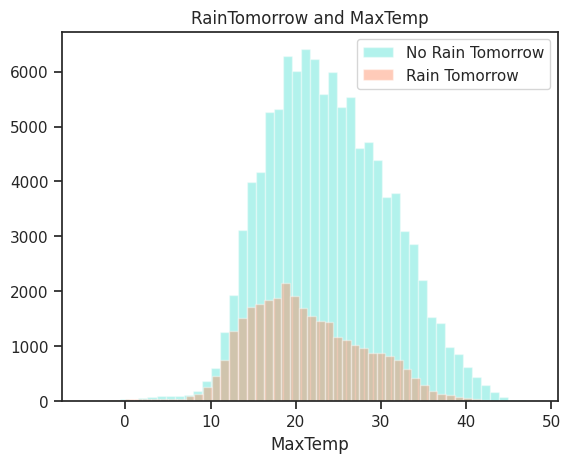

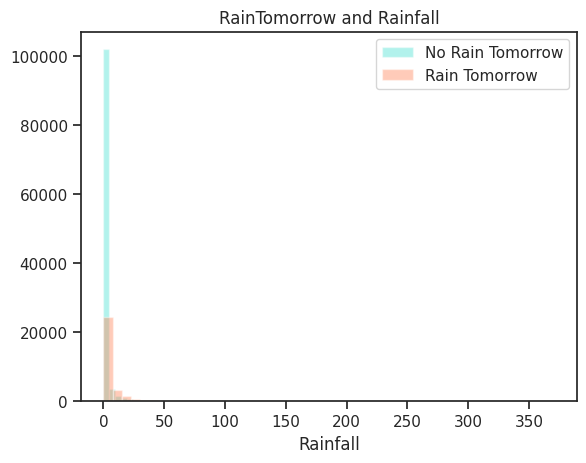

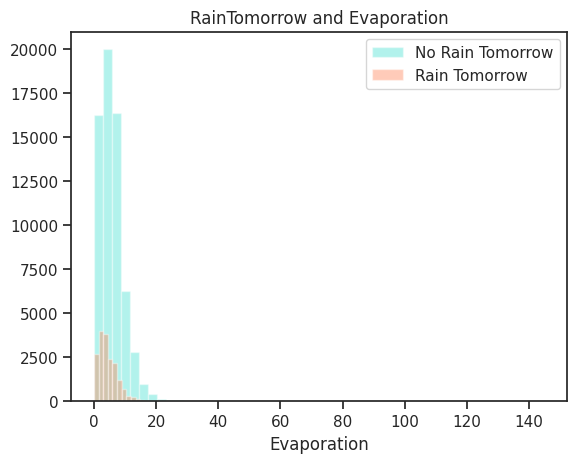

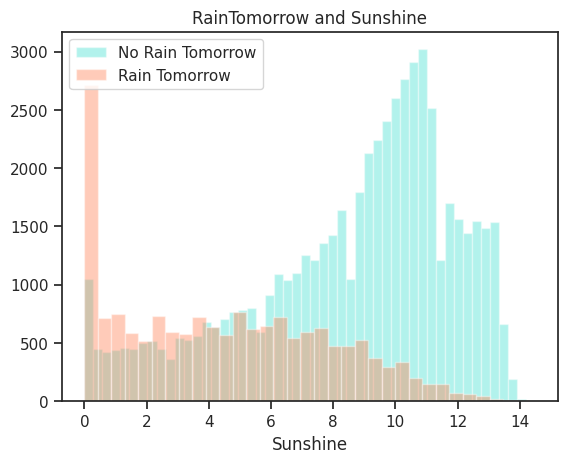

...

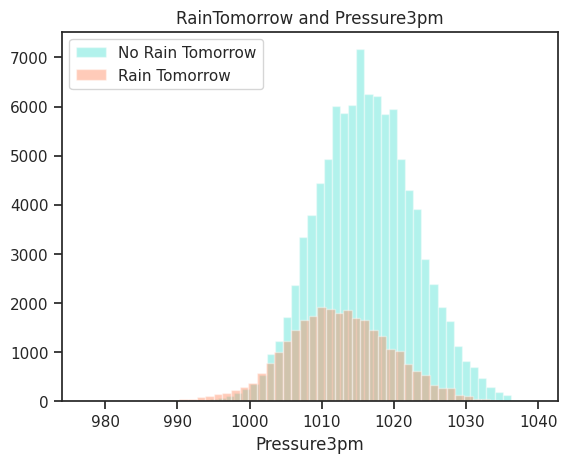

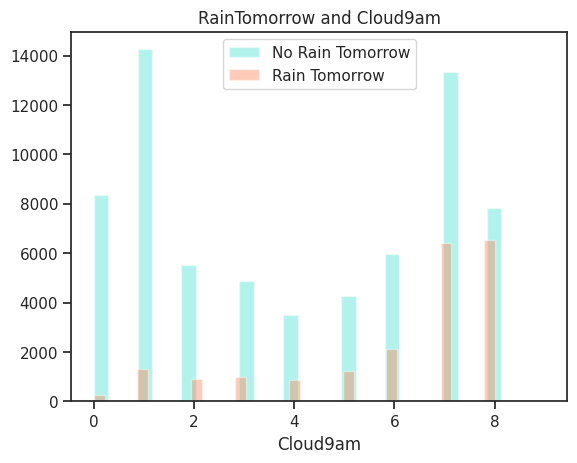

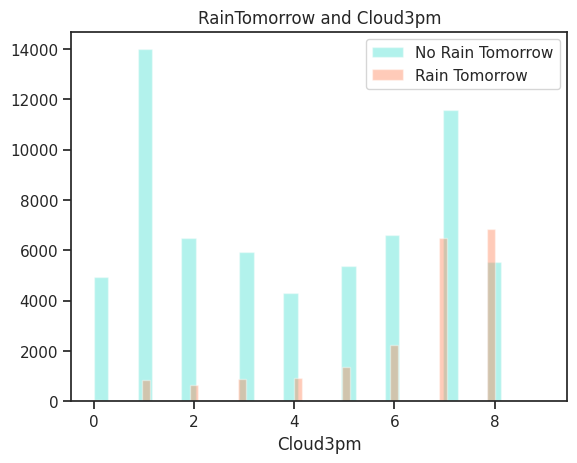

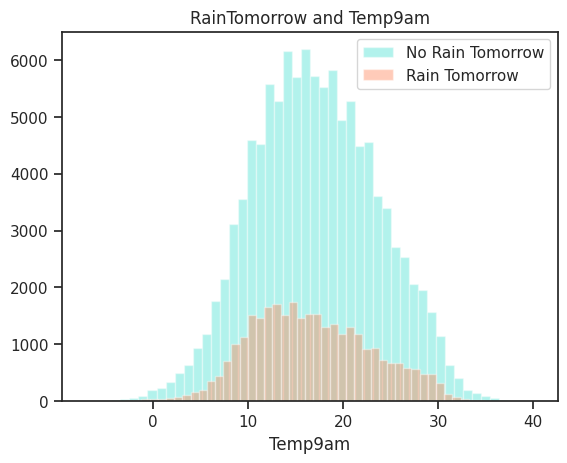

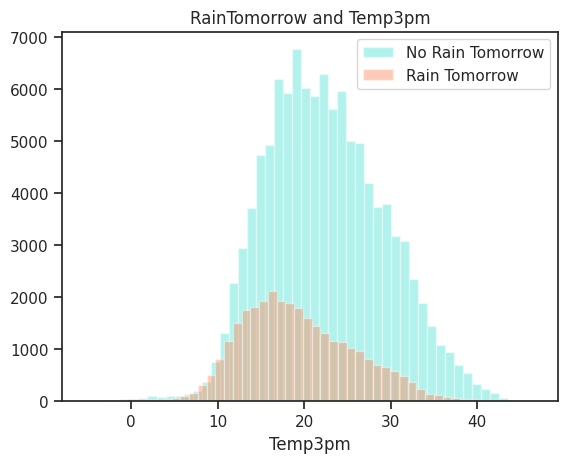

In [ ]:
plt.figure(figsize=(14,3))
for var in continuous_vars:
  var_pivot = df.groupby(var).RainTomorrow.count().reset_index()
  sns.distplot(df[df.RainTomorrow == "No"][var], color='turquoise', kde=False, label='No Rain Tomorrow')
  sns.distplot(df[df.RainTomorrow == "Yes"][var], color='coral', kde=False, label='Rain Tomorrow')
  plt.legend()
  plt.title('RainTomorrow and '+var)
  plt.show()

Findings:
- The MinTemp range for Rain Tomorrow is slightly on the right side of the whole range of MinTemp, with some higher number of Rain Tomorrow days around 10 degrees.
- The MaxTemp range is on the lower side of the whole MaxTemp range. MaxTemp around 15-20 degrees have higher counts of Rain Tomorrow days. And it is unlikely to rain if the MaxTemp is above 35 degrees.
- Rainfall above 5.0 are likely to produce RainTomorrow.
- Lower levels of Evaporation have better chance of RainTomorrow


SECTION 2 - FEATURE ENGINEERING

In [ ]:
df_copy = df.copy()

A. Correlation matrix to avoid multicollinearity

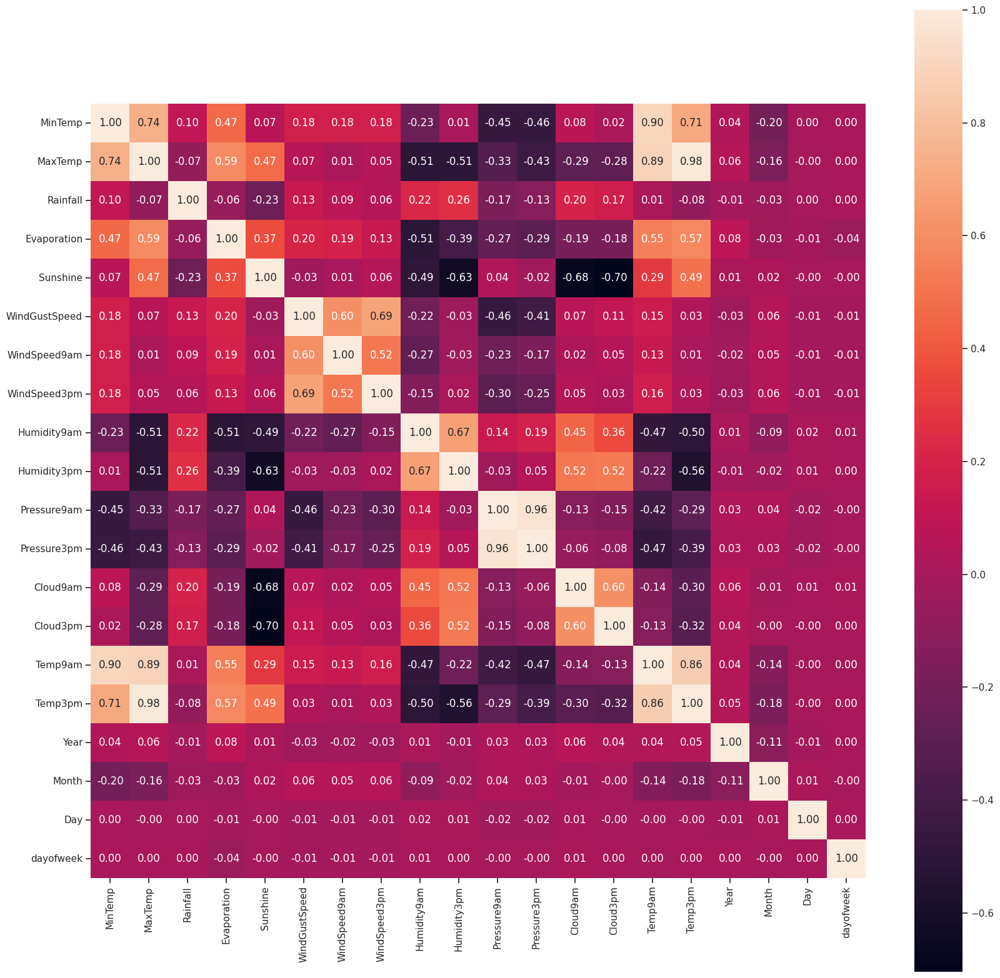

In [ ]:
plt.figure(figsize=(20,20))
ax = sns.heatmap(df_copy.corr(), square=True, annot=True, fmt='.2f')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

- We can see that sunshine and clouds have some correlation with humidity. As we plan to drop sunshine and cloud information, having humidity information should likely fill in as a reliable proxy.
- Min temperature and max temperature are correlated to temperature at 9am and 3pm. We will keep min temperature and max temperature in our model.
- We will also remove date from our feature list as they form an ID. We have extracted day, month and year which will remain in our model.

In [ ]:
dep_var = ['RainTomorrow']

categorical_vars = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

discrete_vars = ['Year', 'Month','Day', 'dayofweek']

continuous_vars = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am','Temp3pm']

continuous_vars_without_correlated_and_nans =  ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm']

In [ ]:
le = preprocessing.LabelEncoder()
df_copy['RainToday'] = le.fit_transform(df_copy['RainToday'])
df_copy['RainTomorrow'] = le.fit_transform(df_copy['RainTomorrow'])

In [ ]:
df_filtered = df_copy[df_copy['RainTomorrow'].notna()]

In [ ]:
df_filtered.shape

(142193, 27)

As we have large number of missing values for evaporation, sunshine and cloud coverage, we will keep one set of features without these columns and see if removing them has a large negative impact on the model.

In [ ]:
# Initializing classifiers to perform cross validation

classifiers = [knnc(),
               dtc(),
               gnb(),
               RandomForestClassifier()]

classifier_names = ['K nearest neighbors',
                    'Decision Tree Classifier',
                    'Gaussian Naive Bayes',
                    'Random forest']

B. Using only selected continuous features

In [ ]:
# Continuous variables - Impute & scale
con_si_step = ('si', SimpleImputer(strategy='most_frequent'))
con_scl_step = ('scl', StandardScaler())

con_steps = [con_si_step, con_scl_step]

con_pipe = Pipeline(con_steps)

con_transformers = [('con', con_pipe, continuous_vars_without_correlated_and_nans)]

In [ ]:
ct = ColumnTransformer(transformers= con_transformers)

ct.fit(df_filtered[continuous_vars_without_correlated_and_nans])

ColumnTransformer(transformers=[('con',
                                 Pipeline(steps=[('si',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('scl', StandardScaler())]),
                                 ['MinTemp', 'MaxTemp', 'Rainfall',
                                  'WindGustSpeed', 'WindSpeed9am',
                                  'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
                                  'Pressure9am', 'Pressure3pm'])])

In [ ]:
# X = ct.transform(df_filtered[categorical_vars + discrete_vars + continuous_vars])
X1 = ct.transform(df_filtered[continuous_vars_without_correlated_and_nans])

y1 = df_filtered[['RainTomorrow']].values

In [ ]:
X1.shape

(142193, 10)

In [ ]:
y1.shape

(142193, 1)

In [ ]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=777)

# print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

In [ ]:
print("Results for the model using only selected continuous features")
for clf, clf_name in zip(classifiers, classifier_names):
    cv_scores = cross_val_score(clf, X1_train, y1_train.ravel(), cv=5)

    print(clf_name, ' mean accuracy: ', round(cv_scores.mean()*100, 3), '% std: ', round(cv_scores.var()*100, 3),'%')

Results for the model using only selected continuous features
K nearest neighbors  mean accuracy:  83.049 % std:  0.001 %
Decision Tree Classifier  mean accuracy:  77.458 % std:  0.0 %
Gaussian Naive Bayes  mean accuracy:  81.696 % std:  0.0 %
Random forest  mean accuracy:  84.855 % std:  0.0 %


In [ ]:
# Categorical - one hot encode
cat_ohe_step = ('ohe', OneHotEncoder(sparse=False, handle_unknown='ignore'))
cat_steps = [cat_ohe_step]
cat_pipe = Pipeline(cat_steps)
cat_transformers = [('cat', cat_pipe, categorical_vars)]

# Discrete - do nothing

# Continuous - impute & scale
con_si_step = ('si', SimpleImputer(strategy='most_frequent'))
con_scl_step = ('scl', MinMaxScaler())

con_steps = [con_si_step, con_scl_step]

con_pipe = Pipeline(con_steps)

con_transformers = [('con', con_pipe, continuous_vars_without_correlated_and_nans)]

ct = ColumnTransformer(transformers=cat_transformers + con_transformers)

ct.fit(df_filtered[categorical_vars + continuous_vars_without_correlated_and_nans])

X2 = ct.transform(df_filtered[categorical_vars + continuous_vars_without_correlated_and_nans])

y2 = df_filtered[['RainTomorrow']].values

X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=777)


In [ ]:
print("Results for the model using all categorical, discrete and selected continuous features")
for clf, clf_name in zip(classifiers, classifier_names):
    cv_scores = cross_val_score(clf, X2_train, y2_train.ravel(), cv=5)

    print(clf_name, ' mean accuracy: ', round(cv_scores.mean()*100, 3), '% std: ', round(cv_scores.var()*100, 3),'%')

Results for the model using all categorical, discrete and selected continuous features
K nearest neighbors  mean accuracy:  81.253 % std:  0.001 %
Decision Tree Classifier  mean accuracy:  78.746 % std:  0.0 %
Gaussian Naive Bayes  mean accuracy:  64.499 % std:  0.003 %
Random forest  mean accuracy:  85.19 % std:  0.0 %


We see that including the categorical, discrete and continuous variables has a better score for Random Forest Model. We will look into this model and other classification models using this as the base dataset in more detail.

In [ ]:

# Define the parameter grids for each classifier
rf_param_grid = {
    'n_estimators': [10, 50, 100],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

lr_param_grid = {
    'C': [0.1, 1, 10],
    'penalty': ['l1', 'l2']
}

# Create instances of the classifiers
rf_classifier = RandomForestClassifier()
lr_classifier = LogisticRegression()

# Create a dictionary of classifiers and their corresponding parameter grids
classifiers = {
    'Random Forest': (rf_classifier, rf_param_grid),
    'Logistic Regression': (lr_classifier, lr_param_grid)
}

# Loop through the classifiers and perform GridSearchCV
for clf_name, (clf, param_grid) in classifiers.items():
    print(clf_name)
    grid_search = GridSearchCV(clf, param_grid, cv=5, n_jobs=-1)
    grid_search.fit(X2_train, y2_train.ravel())
    print('Best parameters:', grid_search.best_params_)
    print('-----')


Random Forest
Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
-----
Logistic Regression
Best parameters: {'C': 10, 'penalty': 'l2'}
-----


In [ ]:
ct_con = ColumnTransformer(transformers= con_transformers)

ct_con.fit(df_filtered[continuous_vars_without_correlated_and_nans])

X_PCA = ct_con.transform(df_filtered[continuous_vars_without_correlated_and_nans])

pca = PCA(n_components=0.95)
pca_result = pca.fit(X_PCA)
columns = ['pca_comp_%i' % i for i in range(6)]
df_pca  = pd.DataFrame(pca.transform(X_PCA), columns=columns)
df_pca.head(2)


,pca_comp_0,pca_comp_1,pca_comp_2,pca_comp_3,pca_comp_4,pca_comp_5
0,0.221218,0.022659,0.087292,0.24479,-0.079863,-0.005671
1,0.338676,-0.100034,0.140785,0.13429,0.105917,0.075565


In [ ]:
disc = df_filtered[discrete_vars]
ct_cat = ColumnTransformer(transformers=cat_transformers)
ct_cat.fit(df_filtered[categorical_vars])
X_cat = ct_cat.transform(df_filtered[categorical_vars])
columns_cat = ['X_cat_%i' % i for i in range(103)]
df_cat  = pd.DataFrame(X_cat, columns=columns_cat)
df_cat.head(2)

,X_cat_0,X_cat_1,X_cat_2,X_cat_3,X_cat_4,X_cat_5,X_cat_6,X_cat_7,X_cat_8,X_cat_9,...,X_cat_93,X_cat_94,X_cat_95,X_cat_96,X_cat_97,X_cat_98,X_cat_99,X_cat_100,X_cat_101,X_cat_102
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


In [ ]:
X_PCA = pd.concat([disc, df_pca, df_cat], axis=1)
y_PCA = df_filtered[['RainTomorrow']].values

In [ ]:
df_filtered.shape

(142193, 27)

In [ ]:
Xpca_train, Xpca_test, ypca_train, ypca_test = train_test_split(X_PCA, y_PCA, test_size=0.2, random_state=777)

In [ ]:
#using the best parameters on X2, y2
# Random Forest
rfc = RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=777)
rfc.fit(X2_train, y2_train.ravel())
rfc_pred = rfc.predict(X2_test)
rfc_acc = accuracy_score(y2_test, rfc_pred)
print("Random Forest accuracy: ", round(rfc_acc*100, 3), "%")

rfc_prob = rfc.predict_proba(X2_test)
rfc_prob = rfc_prob[:,1]
auc_rfc = roc_auc_score(y2_test, rfc_prob)
print('AUC: %.2f' % auc_rfc)

# Logistic Regression
logreg = LogisticRegression(C=10, penalty='l2', random_state=777)
logreg.fit(X2_train, y2_train.ravel())
logreg_pred = logreg.predict(X2_test)
logreg_acc = accuracy_score(y2_test, logreg_pred)
print("Logistic Regression accuracy: ", round(logreg_acc*100, 3), "%")

logreg_prob = logreg.predict_proba(X2_test)
logreg_prob = logreg_prob[:,1]
auc_logreg = roc_auc_score(y2_test, logreg_prob)
print('AUC: %.2f' % auc_logreg)


Random Forest accuracy:  85.481 %
AUC: 0.88
Logistic Regression accuracy:  84.511 %
AUC: 0.86


In [ ]:
# Repeating the process for PCA
# Random Forest
rfc_pca = RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=777)
rfc_pca.fit(Xpca_train, ypca_train.ravel())
rfc_pca_pred = rfc_pca.predict(Xpca_test)
rfc_pca_acc = accuracy_score(ypca_test, rfc_pca_pred)
print("Random Forest with PCA accuracy: ", round(rfc_pca_acc*100, 3), "%")

rfc_pca_prob = rfc_pca.predict_proba(Xpca_test)
rfc_pca_prob = rfc_pca_prob[:,1]
auc_rfc_pca = roc_auc_score(ypca_test, rfc_pca_prob)
print('AUC: %.2f' % auc_rfc_pca)

# Logistic Regression
logreg_pca = LogisticRegression(C=10, penalty='l2', random_state=777)
logreg_pca.fit(Xpca_train, ypca_train.ravel())
logreg_pca_pred = logreg_pca.predict(Xpca_test)
logreg_pca_acc = accuracy_score(ypca_test, logreg_pca_pred)
print("Logistic Regression with PCA accuracy: ", round(logreg_pca_acc*100, 3), "%")

logreg_pca_prob = logreg_pca.predict_proba(Xpca_test)
logreg_pca_prob = logreg_pca_prob[:,1]
auc_logreg_pca = roc_auc_score(ypca_test, logreg_pca_prob)
print('AUC: %.2f' % auc_logreg_pca)

Random Forest with PCA accuracy:  85.031 %
AUC: 0.88
Logistic Regression with PCA accuracy:  81.937 %
AUC: 0.82


Random Forest has the highest Accuracy and Area Under Curve, so we'll proceed with using that.

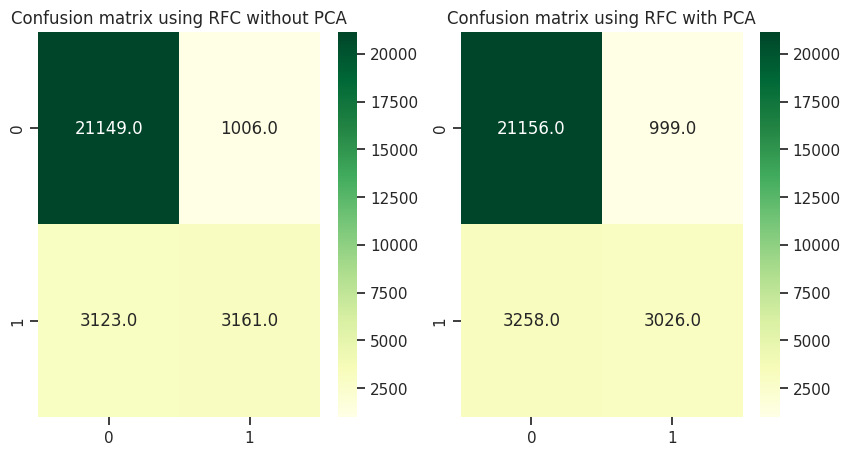



Classification report for RFC without PCA
              precision    recall  f1-score   support

           0       0.87      0.95      0.91     22155
           1       0.76      0.50      0.60      6284

    accuracy                           0.85     28439
   macro avg       0.81      0.73      0.76     28439
weighted avg       0.85      0.85      0.84     28439



Classification report for RFC with PCA
              precision    recall  f1-score   support

           0       0.87      0.95      0.91     22155
           1       0.75      0.48      0.59      6284

    accuracy                           0.85     28439
   macro avg       0.81      0.72      0.75     28439
weighted avg       0.84      0.85      0.84     28439



In [ ]:
# Confusion matrix using RFC on variables with and without PCA

fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize=(10,5))

sns.heatmap(confusion_matrix(y2_test, rfc_pred), annot=True, cmap="YlGn", fmt = ".1f", ax=ax1)
ax1.set_title('Confusion matrix using RFC without PCA')
sns.heatmap(confusion_matrix(ypca_test, rfc_pca_pred), annot=True, cmap="YlGn", fmt = ".1f", ax=ax2)
ax2.set_title('Confusion matrix using RFC with PCA')
plt.show()

# Classification reports using RFC on variables with and without PCA

print("\n\nClassification report for RFC without PCA")
print(classification_report(y2_test, rfc_pred))

print("\n\nClassification report for RFC with PCA")
print(classification_report(y2_test, rfc_pca_pred))

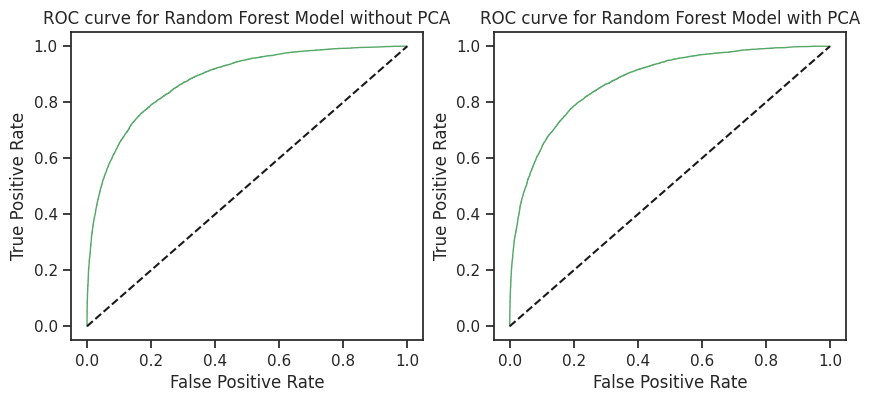

In [ ]:
fpr2, tpr2, thresholds2 = roc_curve(y2_test, rfc_prob)
fpr_pca, tpr_pca, thresholds_pca = roc_curve(ypca_test, rfc_pca_prob)

fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize=(10,4))

ax1.plot(fpr2,tpr2,'-g',linewidth=1)
ax1.plot([0,1], [0,1], 'k--' )
ax1.set_title('ROC curve for Random Forest Model without PCA')
ax1.set_xlabel("False Positive Rate")
ax1.set_ylabel('True Positive Rate')

ax2.plot(fpr_pca,tpr_pca,'-g',linewidth=1)
ax2.plot([0,1], [0,1], 'k--' )
ax2.set_title('ROC curve for Random Forest Model with PCA')
ax2.set_xlabel("False Positive Rate")
ax2.set_ylabel('True Positive Rate')

plt.show()